<a href="https://colab.research.google.com/github/healthonrails/annolid/blob/main/docs/tutorials/Annolid_on_Detectron2_Tutorial.ipynb" target="_blank"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-gyockyxk
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-gyockyxk
  Resolved https://github.com/facebookresearch/detectron2.git to commit 9604f5995cc628619f0e4fd913453b4d7d61db3f
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.3/81.3 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 39.6 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp31

In [2]:
import torch
if torch.cuda.is_available():
    GPU = True
    print('gpu available')
else:
    GPU = False
    print('no gpu')

gpu available


In [3]:
import torch, torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

import pandas as pd
import numpy as np
import os
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import cv2
import random
from ast import literal_eval

In [4]:
!pip install -U aicrowd-cli

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.0/51.0 kB 4.9 MB/s eta 0:00:00


In [5]:
API_KEY = "c9eff61ed0464a10bb065b62a4f29ef7"
!aicrowd login --api-key $API_KEY

API Key valid
Gitlab oauth token invalid or absent.
It is highly recommended to simply run `aicrowd login` without passing the API Key.
Saved details successfully!


In [6]:
!aicrowd dataset download --challenge debris-detection

sample_submission.csv: 100% 1.98M/1.98M [00:01<00:00, 1.53MB/s]
test.zip: 100% 259M/259M [00:25<00:00, 10.1MB/s]
train.csv: 100% 1.78M/1.78M [00:01<00:00, 1.52MB/s]
train.zip: 100% 1.04G/1.04G [01:39<00:00, 10.4MB/s]
val.csv: 100% 176k/176k [00:00<00:00, 270kB/s]
val.zip: 100% 104M/104M [00:16<00:00, 6.25MB/s]


In [7]:
!rm -rf data
!mkdir data

!unzip train.zip -d data/train > /dev/null

!unzip val.zip -d data/val > /dev/null

!unzip test.zip -d data/test > /dev/null

!mv train.csv data/train.csv
!mv val.csv data/val.csv

In [8]:
data_path = "data"

train_df = pd.read_csv(os.path.join(data_path, "train.csv"))
val_df = pd.read_csv(os.path.join(data_path, "val.csv"))

In [9]:
train_df

,ImageID,bboxes
0,0,"[[282, 308, 58, 86], [228, 256, 191, 218], [10..."
1,1,"[[97, 127, 297, 332], [315, 352, 136, 168], [7..."
2,2,"[[45, 76, 244, 269], [154, 182, 457, 484], [20..."
3,3,"[[252, 282, 86, 110], [315, 333, 379, 412], [2..."
4,4,"[[175, 203, 406, 440], [57, 86, 433, 464], [26..."
...,...,...
19995,19995,"[[226, 247, 396, 424], [301, 323, 454, 479], [..."
19996,19996,"[[228, 256, 149, 177], [42, 71, 294, 331], [28..."
19997,19997,"[[443, 474, 153, 181], [138, 166, 193, 219], [..."
19998,19998,"[[34, 70, 178, 217], [400, 443, 127, 161], [43..."


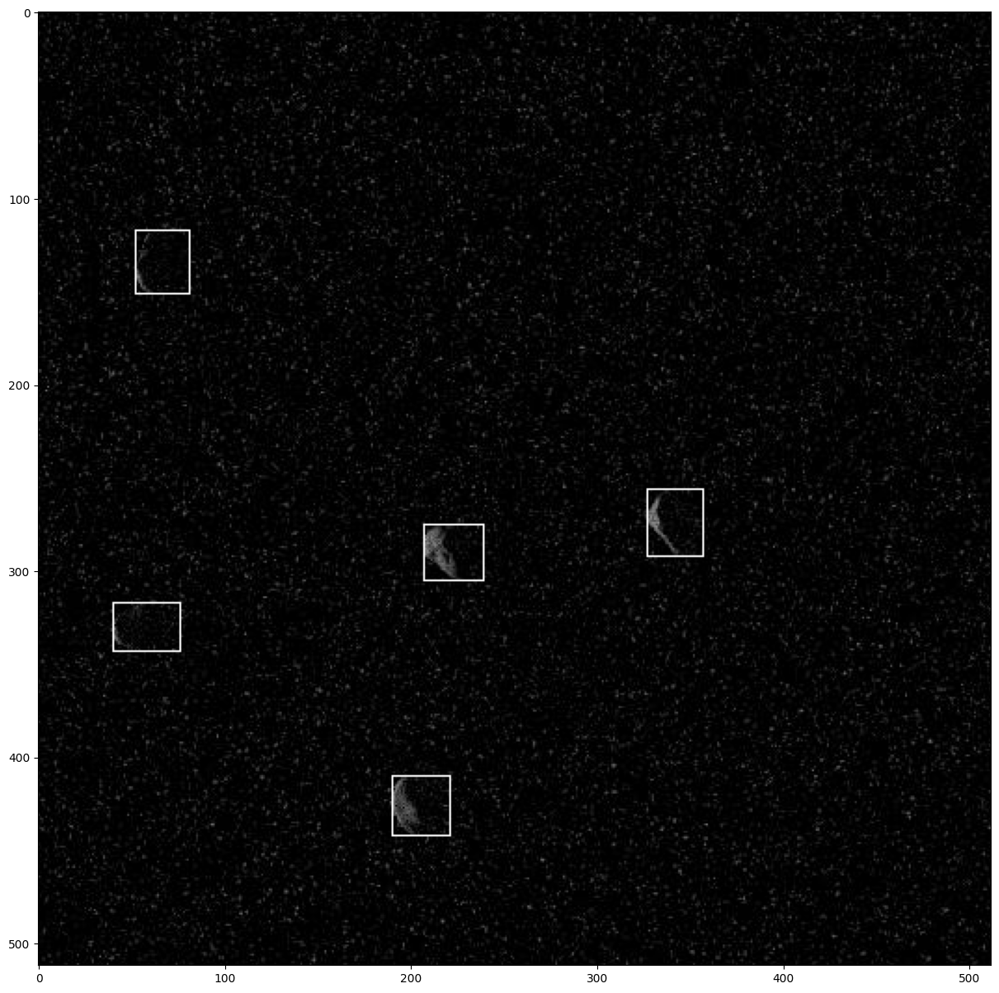

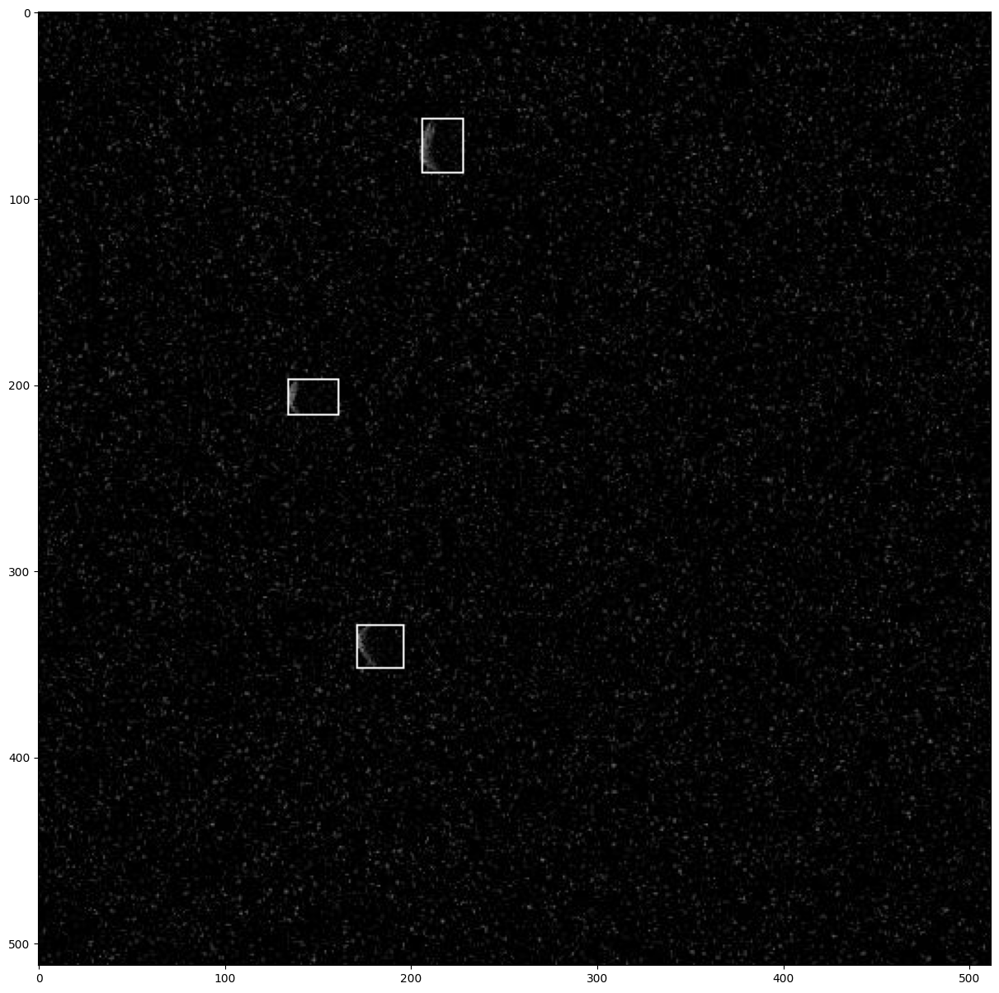

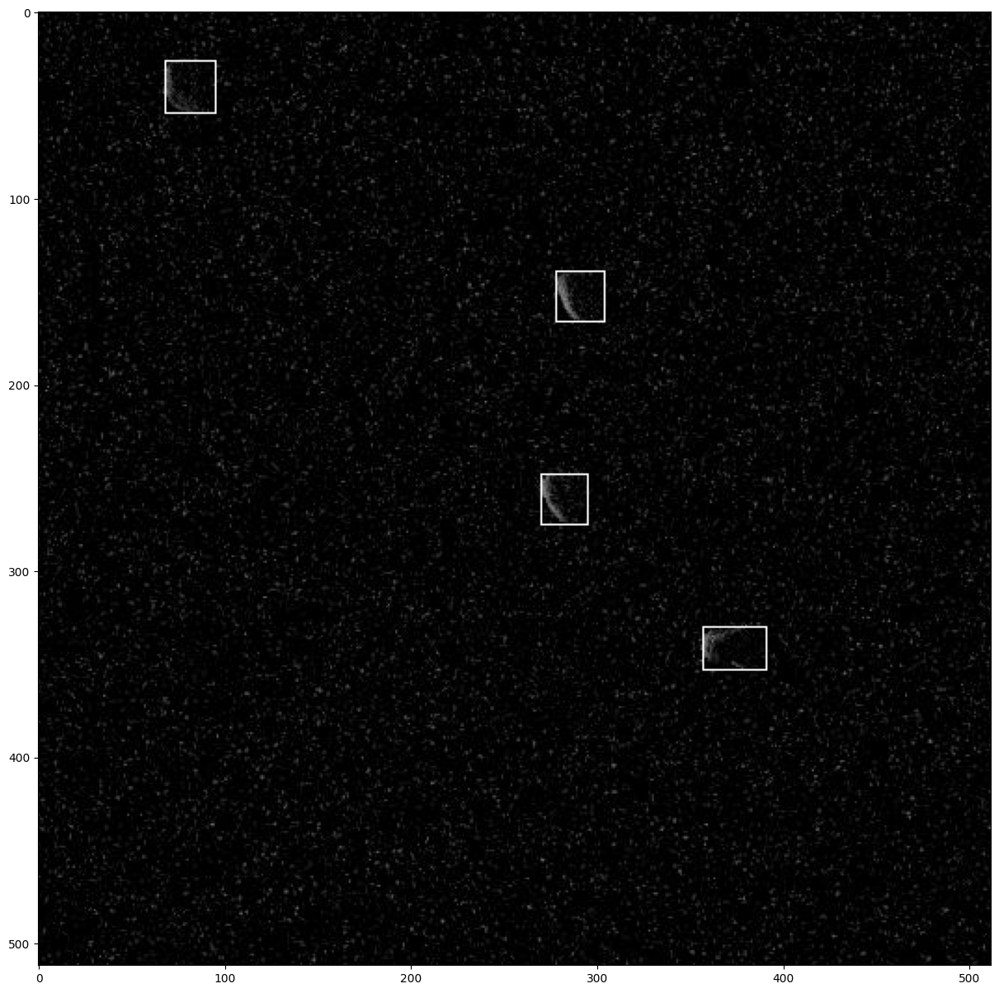

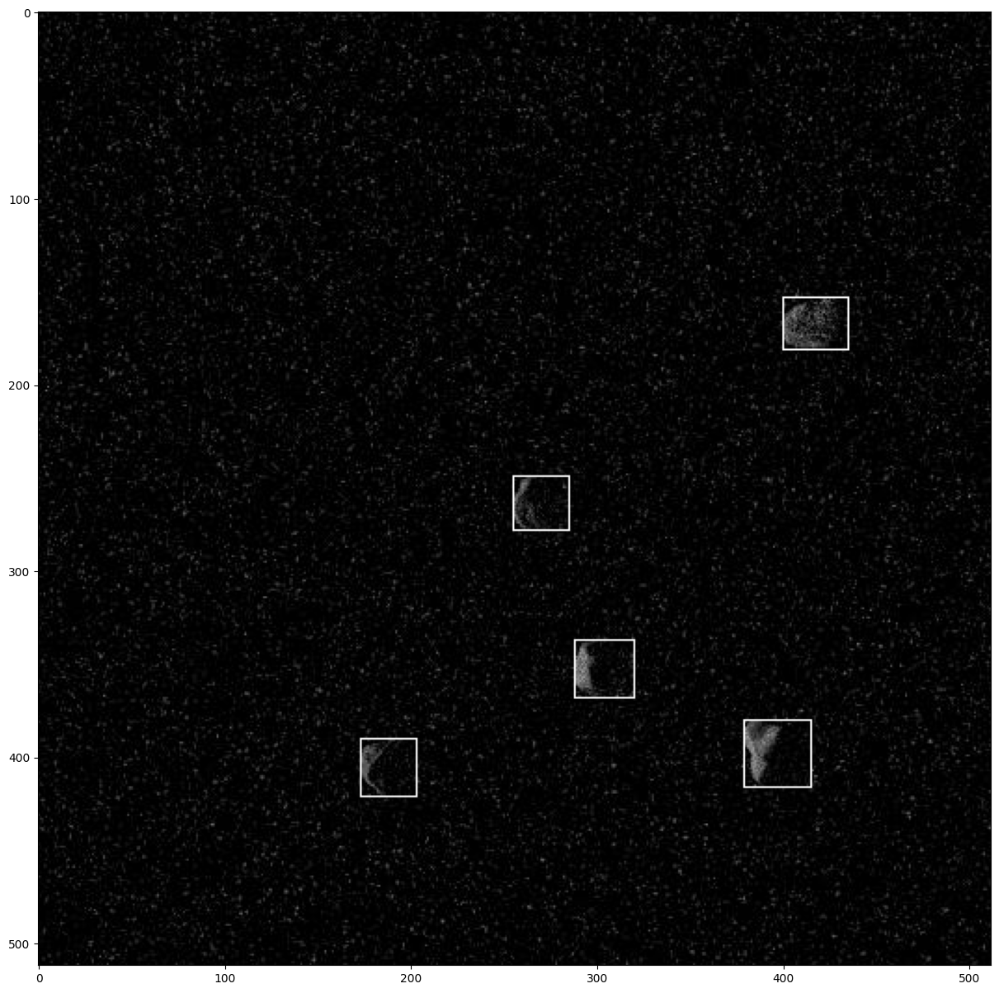

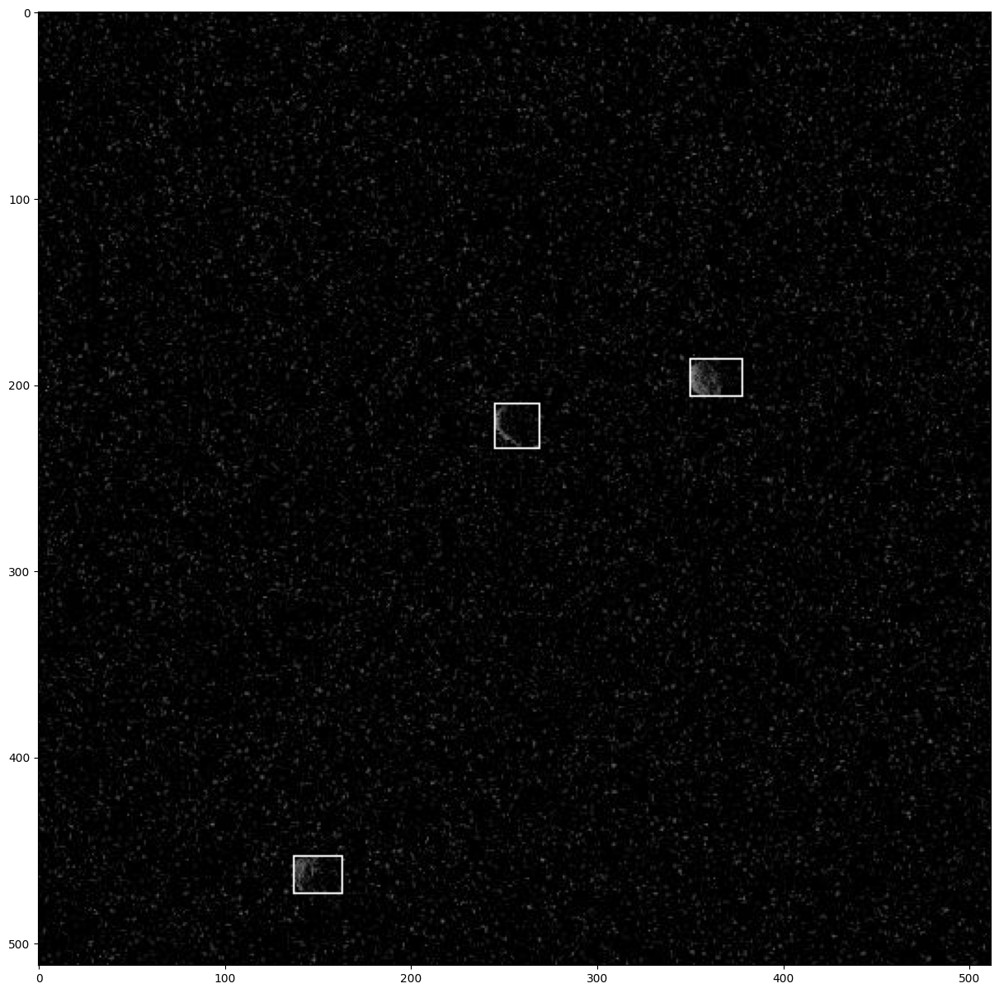

In [10]:
def show_images(images, num = 5):

    images_to_show = np.random.choice(images, num)

    for image_id in images_to_show:

        image = Image.open(f"data/train/{image_id}.jpg")

        bboxes = literal_eval(train_df.loc[train_df['ImageID'] == image_id]['bboxes'].values[0])

        draw = ImageDraw.Draw(image)
        for bbox in bboxes:
            draw.rectangle([bbox[0], bbox[2], bbox[1], bbox[3]], width=1)

        plt.figure(figsize = (15,15))
        plt.imshow(image)
        plt.show()

show_images(train_df['ImageID'].unique(), num = 5)

In [11]:
dict_dataset = []
def get_dataset_dics():

    for index, row in train_df.iterrows():

        image = Image.open(os.path.join(data_path, f"train/{row['ImageID']}.jpg"))
        w, h = image.size

        ann_lst = []

        bboxes = literal_eval(row['bboxes'])

        for n, bbox in enumerate(bboxes):

            ann_dict = {'bbox': [bbox[0], bbox[2], bbox[1], bbox[3]],
           'bbox_mode': BoxMode.XYXY_ABS,
           'category_id': 0, #i[1]['category_id'].values[0],
           'iscrowd': 0}

            ann_lst.append(ann_dict)

        image_dict = {'annotations': ann_lst,
            'file_name': os.path.join(data_path, f"train/{row['ImageID']}.jpg"),
            'height': h,
            'image_id': row["ImageID"], #i[1]['image_category_id'].values[0],
            'width': w}

        dict_dataset.append(image_dict)

    return dict_dataset

dict_dataset = get_dataset_dics()

In [12]:
d = f"debris_train{np.random.randint(10000)}"
DatasetCatalog.register(d, lambda d=d : get_dataset_dics())
MetadataCatalog.get(d).set(thing_classes=["Debris"])
obj_metadata = MetadataCatalog.get(d)

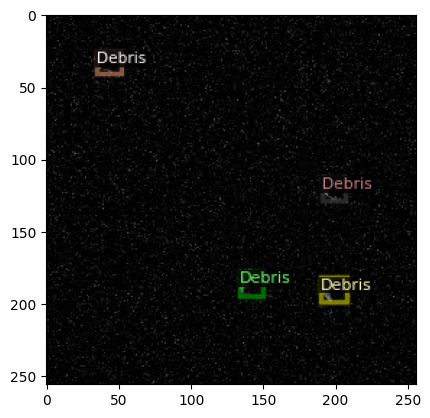

In [13]:
for i in random.sample(dict_dataset, 3):
    img = cv2.imread(i["file_name"])
    visualizer = Visualizer(img, metadata=obj_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(i)
    plt.imshow(out.get_image())

In [14]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_DC5_3x.yaml"))
cfg.DATASETS.TRAIN = (d,)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_DC5_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 200
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [15]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[02/08 17:42:56 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_68d202.pkl: 663MB [00:29, 22.7MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[02/08 17:43:33 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/08 17:43:46 d2.utils.events]:  eta: 0:01:17  iter: 19  total_loss: 1.323  loss_cls: 0.6995  loss_box_reg: 0.5783  loss_rpn_cls: 0.0372  loss_rpn_loc: 0.009058    time: 0.4489  last_time: 0.5089  data_time: 0.0172  last_data_time: 0.0116   lr: 2.3976e-05  max_mem: 3370M
[02/08 17:44:00 d2.utils.events]:  eta: 0:01:08  iter: 39  total_loss: 1.02  loss_cls: 0.4191  loss_box_reg: 0.5612  loss_rpn_cls: 0.03149  loss_rpn_loc: 0.009294    time: 0.4417  last_time: 0.4241  data_time: 0.0112  last_data_time: 0.0295   lr: 4.8951e-05  max_mem: 3370M
[02/08 17:44:09 d2.utils.events]:  eta: 0:01:00  iter: 59  total_loss: 0.9249  loss_cls: 0.2664  loss_box_reg: 0.6021  loss_rpn_cls: 0.01916  loss_rpn_loc: 0.008552    time: 0.4447  last_time: 0.4329  data_time: 0.0113  last_data_time: 0.0045   lr: 7.3926e-05  max_mem: 3371M
[02/08 17:44:18 d2.utils.events]:  eta: 0:00:52  iter: 79  total_loss: 0.8618  loss_cls: 0.2085  loss_box_reg: 0.6513  loss_rpn_cls: 0.01333  loss_rpn_loc: 0.008096    time: 0.

In [16]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [17]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)

[02/08 17:50:55 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

In [18]:
test_imgs_paths = os.listdir(os.path.join(data_path, "test"))

predictions = {"ImageID":[], "bboxes":[]}

for test_img_path in tqdm(test_imgs_paths):

  img = cv2.imread(os.path.join(data_path, "test", test_img_path))
  h, w, _ = img.shape

  model_predictions = predictor(img)

  bboxes = model_predictions['instances'].pred_boxes.tensor.cpu().numpy().tolist()
  scores = model_predictions['instances'].scores.cpu().numpy().tolist()

  for n, bbox in enumerate(bboxes):

      bboxes[n] == bbox.append(scores[n])

  image_id = test_img_path.split('.')[0]

  predictions['ImageID'].append(image_id)
  predictions['bboxes'].append(bboxes)

  0%|          | 0/5000 [00:00<?, ?it/s]

In [19]:
submission = pd.DataFrame(predictions)
submission

,ImageID,bboxes
0,2535,"[[360.4900207519531, 421.6808776855469, 386.99..."
1,4336,"[[28.393911361694336, 408.4031677246094, 55.63..."
2,4821,"[[409.55499267578125, 198.4417724609375, 436.6..."
3,3623,"[[177.0428466796875, 55.4532470703125, 204.588..."
4,685,"[[74.48613739013672, 53.49018859863281, 102.86..."
...,...,...
4995,2031,"[[350.2088317871094, 340.33819580078125, 379.0..."
4996,2132,"[[149.4950714111328, 234.63926696777344, 174.7..."
4997,871,"[[373.0574035644531, 211.2058563232422, 401.59..."
4998,2228,"[[350.3152160644531, 369.7606201171875, 377.53..."


In [20]:
submission.to_csv("submission.csv", index=False)

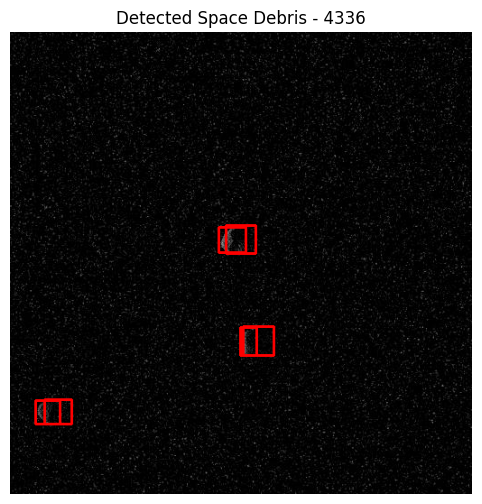

In [21]:
import os
import cv2
import matplotlib.pyplot as plt

# Select an image to visualize
image_id = submission["ImageID"][1]  # Get first image ID
bboxes = submission["bboxes"][1]  # Get corresponding bounding boxes

# Load the image
img_path = os.path.join(data_path, "test", f"{image_id}.jpg")
img = cv2.imread(img_path)

if img is None:
    print(f"Error: Image {img_path} not found!")
else:
    # Convert from BGR to RGB (Matplotlib displays in RGB)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Draw bounding boxes
    for bbox in bboxes:
        x_min, y_min, x_max, y_max, score = bbox  # Ensure correct order
        color = (255, 0, 0)  # Red color for boxes
        thickness = 2
        img = cv2.rectangle(img, (int(x_min), int(y_min)), (int(x_max), int(y_max)), color, thickness)

    # Display image
    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.axis("off")  # Hide axis
    plt.title(f"Detected Space Debris - {image_id}")
    plt.show()


[02/08 18:33:35 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from output/model_final.pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

<IPython.core.display.Javascript object>

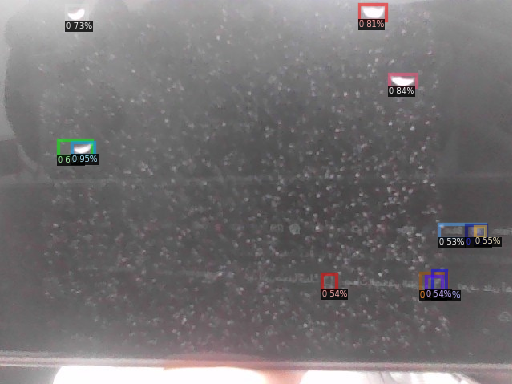

In [24]:
import cv2
import torch
import numpy as np
import IPython.display
from google.colab.patches import cv2_imshow
from google.colab import output
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
import time
import base64
import numpy as np

# 1️⃣ Load Trained Faster R-CNN Model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_DC5_3x.yaml"))
cfg.MODEL.WEIGHTS = "output/model_final.pth"  # Ensure this path is correct
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Confidence threshold
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Only one class (Debris)
predictor = DefaultPredictor(cfg)

# 2️⃣ Function to Capture Image from Google Colab Camera
def take_photo(filename='photo.jpg'):
    js = '''
    async function takePhoto() {
        const div = document.createElement('div');
        const video = document.createElement('video');
        const btn = document.createElement('button');
        btn.textContent = 'Take Photo';
        div.appendChild(video);
        div.appendChild(btn);
        document.body.appendChild(div);

        const stream = await navigator.mediaDevices.getUserMedia({video: true});
        video.srcObject = stream;
        await video.play();

        await new Promise((resolve) => btn.onclick = resolve);
        const canvas = document.createElement('canvas');
        canvas.width = video.videoWidth;
        canvas.height = video.videoHeight;
        canvas.getContext('2d').drawImage(video, 0, 0);
        stream.getTracks().forEach(track => track.stop());

        document.body.removeChild(div);
        return canvas.toDataURL('image/jpeg');
    }
    takePhoto();
    '''
    display(IPython.display.Javascript(js))
    data = output.eval_js('takePhoto()')
    binary = np.frombuffer(base64.b64decode(data.split(',')[1]), dtype=np.uint8)
    img = cv2.imdecode(binary, cv2.IMREAD_COLOR)
    cv2.imwrite(filename, img)
    return filename

# 3️⃣ Capture an Image from the Camera
image_path = take_photo()

# 4️⃣ Read the Image and Run Object Detection
frame = cv2.imread(image_path)
image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
outputs = predictor(image)

# 5️⃣ Draw Bounding Boxes
metadata = MetadataCatalog.get("debris_test")  # Adjust dataset name if needed
v = Visualizer(frame[:, :, ::-1], metadata=metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))

# 6️⃣ Display the Detected Image
cv2_imshow(v.get_image()[:, :, ::-1])
